In [10]:
%load_ext autoreload

# Enable autoreload for all modules
%autoreload 2


import data_loader
import numpy as np 
import matplotlib.pyplot as plt
import torch

from graph_plotting import graph_2D
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from torch_geometric.nn import global_mean_pool, global_max_pool, global_add_pool
from models import graph_classifier, gnn_models
from torch_geometric.loader import DataLoader
from torch_geometric.loader import NeighborLoader, GraphSAINTRandomWalkSampler

from loader.custom_loader import RandomWalkIterator, NeighborIterator, RectangularIterator

#import torch_geometric

from evaluation import evaluation
from patch_evaluation import patch_evaluation

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
#octa500_loader_4_cls = data_loader.RetinaLoaderTorch("/home/laurin/Documents/octa_retina/graphs", "/home/laurin/Documents/octa_retina/labels.xlsx", two_cls= False)
#octa500_loader_2_cls = data_loader.RetinaLoaderTorch("/home/laurin/Documents/octa_retina/graphs", "/home/laurin/Documents/octa_retina/labels.xlsx", two_cls= True)

#octa500_loader_4_cls = data_loader.RetinaLoaderTorch("/media/data/alex_johannes/octa_data/graphs", "/media/data/alex_johannes/octa_data/labels.xlsx", two_cls= False)
octa500_loader_2_cls = data_loader.RetinaLoaderTorch("/media/data/alex_johannes/octa_data/graphs", "/media/data/alex_johannes/octa_data/labels.xlsx", two_cls= True)

In [3]:
np.random.seed(0)

work_data = octa500_loader_2_cls.line_data
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

train_mask = np.random.choice(np.arange(0, len(work_data)), size= int(len(work_data)*0.8), replace = False)
test_mask = np.delete(np.arange(0, len(work_data)), train_mask)

train_list_bin = []
test_list_bin = []

for i, data in enumerate(work_data.values()):
    if i in train_mask:
        train_list_bin.append(data.to(device))
    else:
        test_list_bin.append(data.to(device))

/home/alex_johannes/octa_gnn/OCTA_gnn/.venv/lib/python3.10/site-packages/torch/cuda/__init__.py:546: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


Epoch: 001, Loss: 0.063019, Train Acc: 0.8438, Test Acc: 0.9000, Test Bal Acc: 0.5000
Epoch: 002, Loss: 0.024551, Train Acc: 0.1562, Test Acc: 0.1000, Test Bal Acc: 0.5000
Epoch: 003, Loss: 0.022010, Train Acc: 0.8438, Test Acc: 0.9000, Test Bal Acc: 0.5000
Epoch: 004, Loss: 0.021559, Train Acc: 0.1562, Test Acc: 0.1000, Test Bal Acc: 0.5000
Epoch: 005, Loss: 0.020739, Train Acc: 0.1562, Test Acc: 0.1000, Test Bal Acc: 0.5000
Epoch: 006, Loss: 0.020662, Train Acc: 0.9250, Test Acc: 1.0000, Test Bal Acc: 1.0000
Epoch: 007, Loss: 0.020026, Train Acc: 0.1562, Test Acc: 0.1000, Test Bal Acc: 0.5000
Epoch: 008, Loss: 0.020403, Train Acc: 0.8625, Test Acc: 0.9250, Test Bal Acc: 0.6250
Epoch: 009, Loss: 0.019617, Train Acc: 0.9000, Test Acc: 0.9750, Test Bal Acc: 0.8750
Epoch: 010, Loss: 0.020678, Train Acc: 0.8438, Test Acc: 0.9000, Test Bal Acc: 0.5000
Epoch: 011, Loss: 0.020315, Train Acc: 0.5875, Test Acc: 0.4250, Test Bal Acc: 0.6806
Epoch: 012, Loss: 0.019261, Train Acc: 0.9250, Test Ac

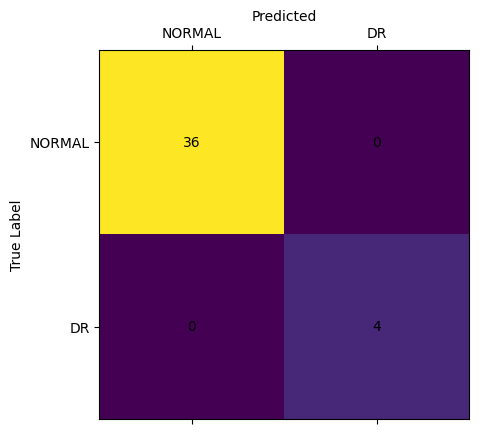

In [4]:
# selection of the features to use
num_features = train_list_bin[0].x.shape[1]
num_classes = 2
epochs = 50

# try different aggregation modes:
# other aggragtion schemas not supported for batches


# create the model
model = gnn_models.GCN_GC(in_channels= num_features, hidden_channels = 64, out_channels= num_classes, num_layers= 5, dropout = 0.2, aggregation_mode= global_mean_pool)

# create brach data loaders for training and test set
train_loader = DataLoader(train_list_bin, batch_size = 32, shuffle=True)
test_loader = DataLoader(test_list_bin, batch_size = 1, shuffle=False)

#train_loader = NeighborIterator(train_list_bin, neighborhood_size=50, start_node_fraction=0.01)
#test_loader = NeighborIterator(test_list_bin, neighborhood_size=50, start_node_fraction=0.01)

#train_loader = RectangularIterator(train_list_bin, selections_per_graph=10, rect_size=300)
#test_loader = RectangularIterator(test_list_bin, selections_per_graph=10, rect_size=300)

# weigthings for imbalanced classes 
train_labels = [lab["y"].cpu() for lab in train_list_bin]
weights = 1/np.unique(train_labels, return_counts= True)[1]
balanced_loss = torch.nn.CrossEntropyLoss(torch.tensor(weights).to(device).float())
unbalanced_loss = torch.nn.CrossEntropyLoss() # use when the training data is already balanced

# trainloader can be anything 
classifier = graph_classifier.graphClassifierClassic(model, train_loader, test_loader, balanced_loss)


for epoch in range(1, epochs+1):
    loss = classifier.train()
    train_acc = classifier.test(train_loader)
    #test_acc = classifier.test(test_loader)
    outList, yList = classifier.predict(test_loader)
    y_p = np.array([item.argmax().cpu().detach().numpy() for sublist in outList for item in sublist])
    y_t = np.array([item.detach().cpu().numpy() for sublist in yList for item in sublist])
    print(f'Epoch: {epoch:03d}, Loss: {loss:.6f}, Train Acc: {train_acc:.4f}, Test Acc: {accuracy_score(y_t, y_p):.4f}, Test Bal Acc: {balanced_accuracy_score(y_t, y_p):.4f}')


fig, ax = plt.subplots()
#evaluation.plot_confusion_matrix(y_t, y_p, ["NORMAL", "DR", "CNV", "AMD"], ax)
evaluation.plot_confusion_matrix(y_t, y_p, ["NORMAL", "DR"], ax)

In [6]:
# evaluate on partitions:

#test_loader_regions = RectangularIterator(test_list_bin, selections_per_graph=100, rect_size=300, stratified= False, shuffle= False)
train_loader_regions = RectangularIterator(train_list_bin, selections_per_graph=400, rect_size=150, stratified= False, shuffle= False)

loader_sel = train_loader_regions

outList, yList = classifier.predict(loader_sel)
last_id_list =loader_sel.last_id_list
last_region_list =loader_sel.last_region_list

In [7]:
ids = [graph.graph_id for graph in train_list_bin]
labs = [int(graph.y[0]) for graph in train_list_bin]
diseased_idx = np.where(np.array(labs) == 1)[0]

In [8]:
diseased_idx

array([  3,   5,   9,  13,  15,  21,  28,  36,  39,  43,  53,  54,  64,
        66,  71,  92,  96, 106, 107, 110, 119, 123, 133, 142, 158])

10301


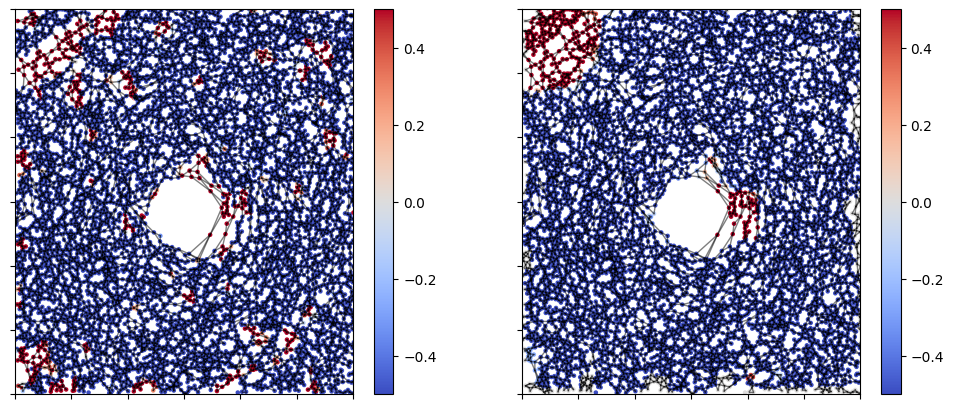

10302


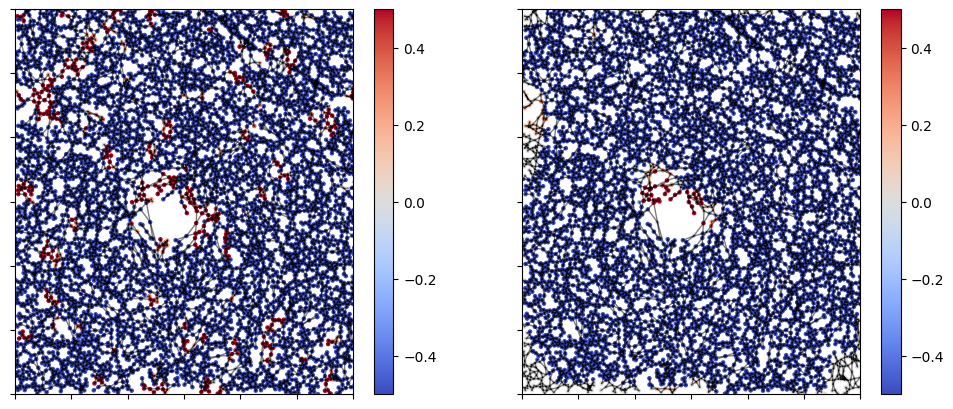

10303


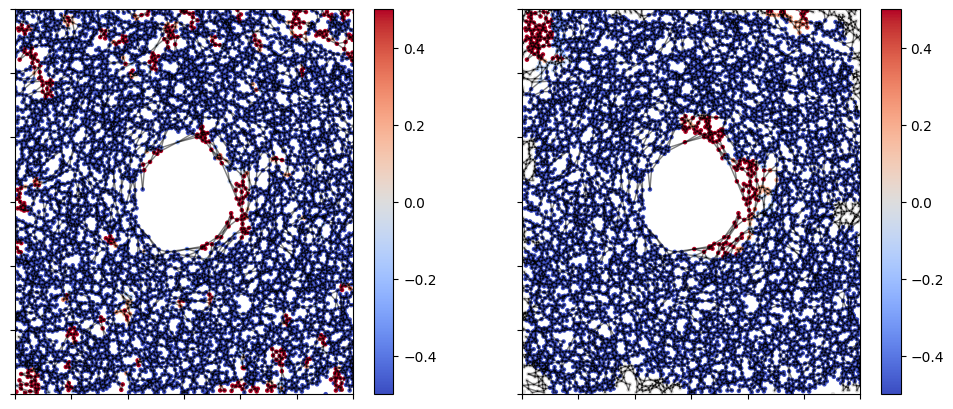

10304


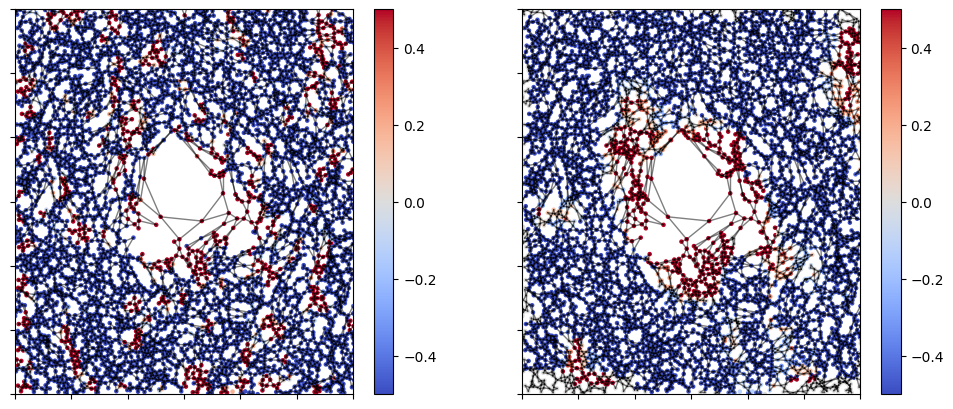

10305


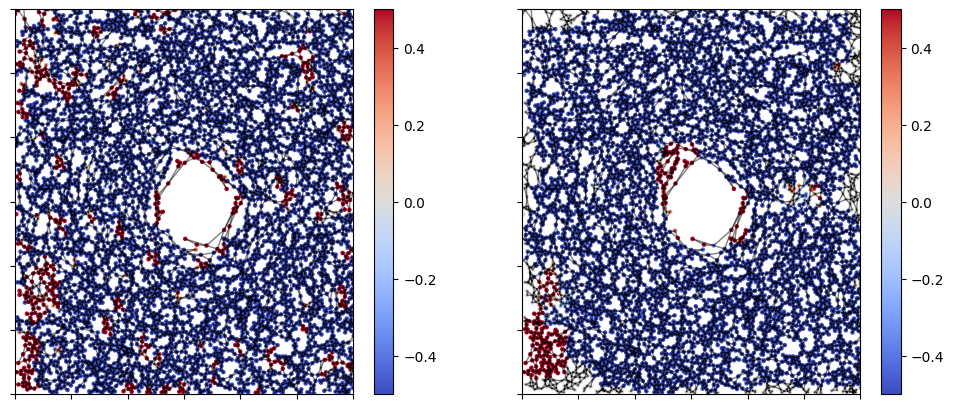

10306


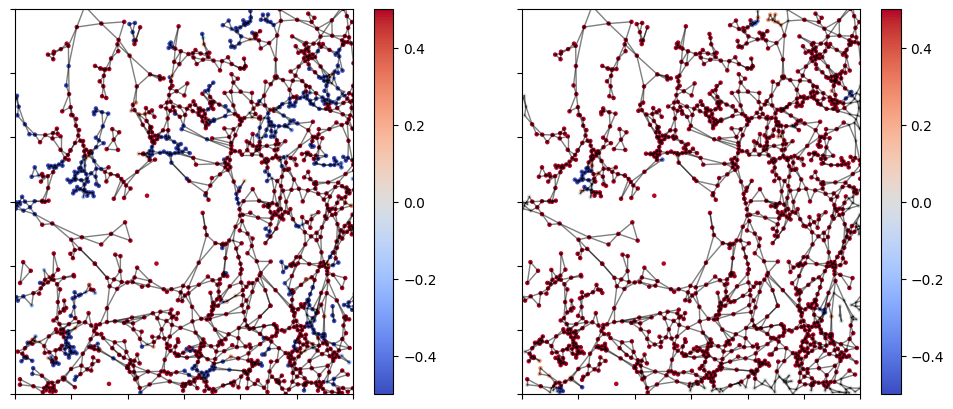

10307


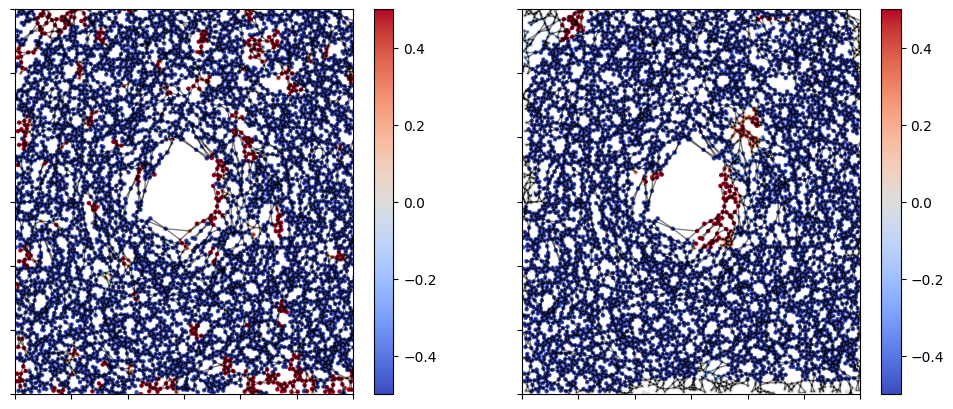

10308


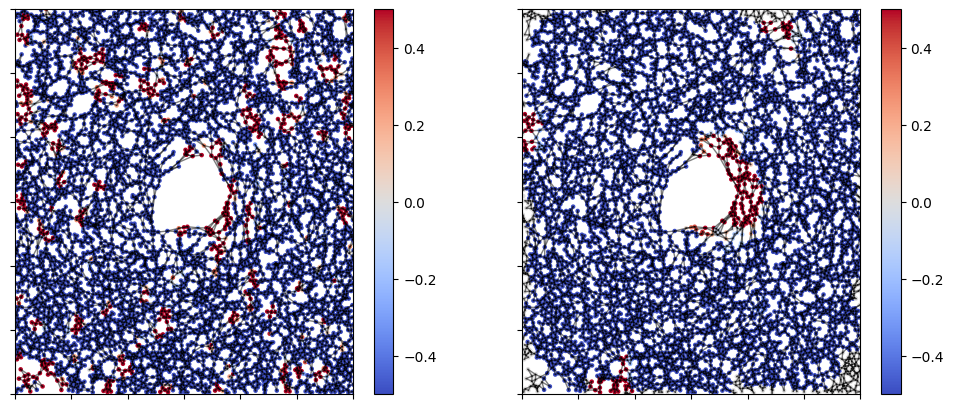

10309


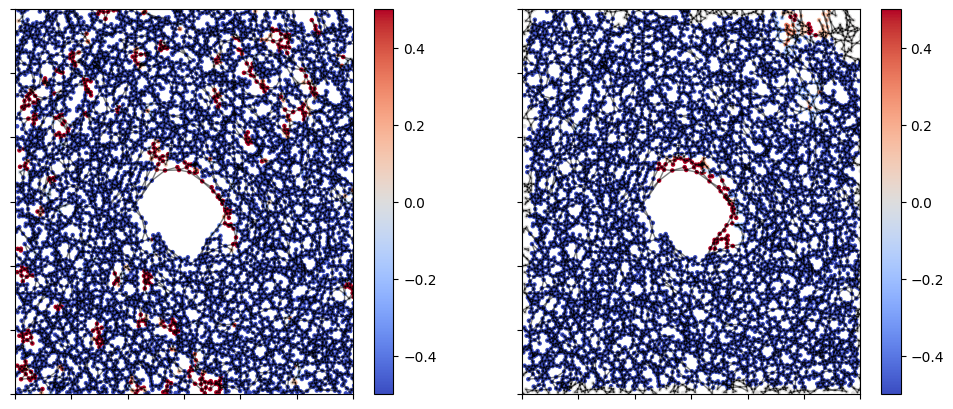

10311


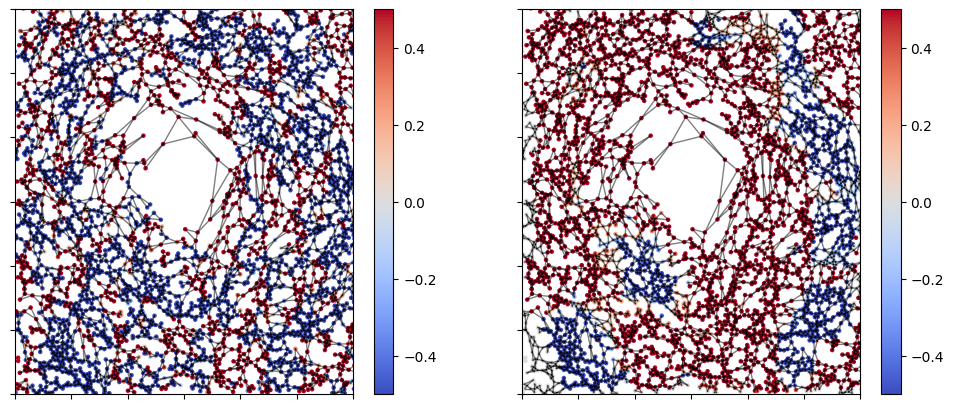

10312


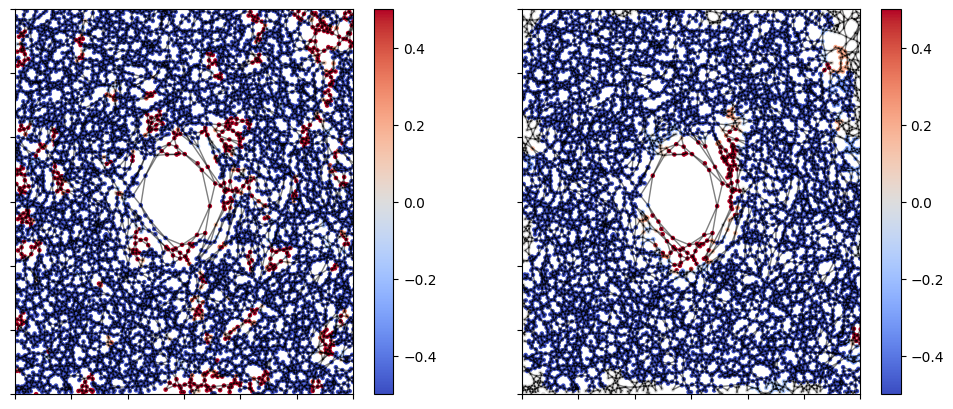

10313


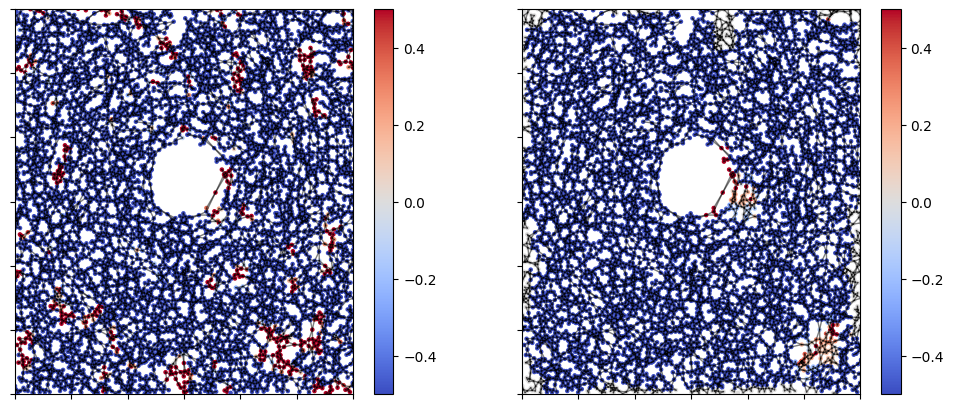

10314


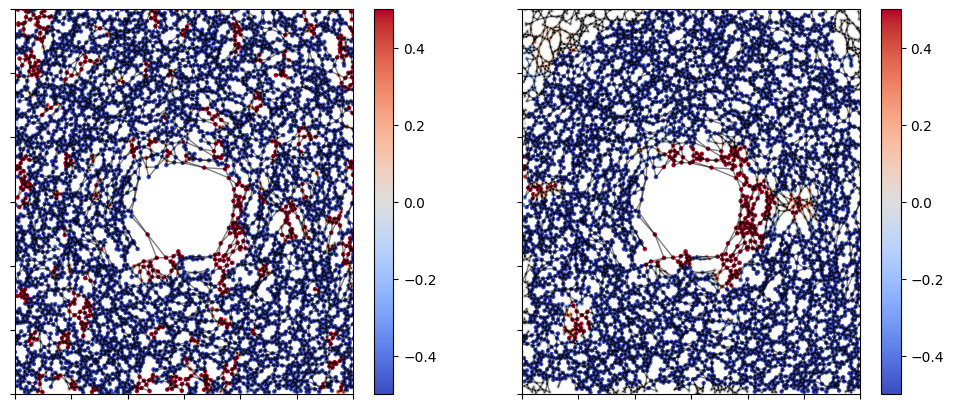

10315


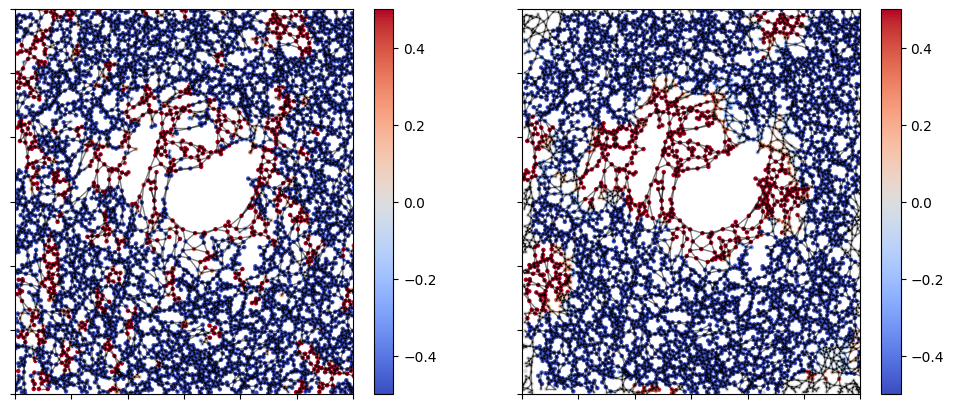

10316


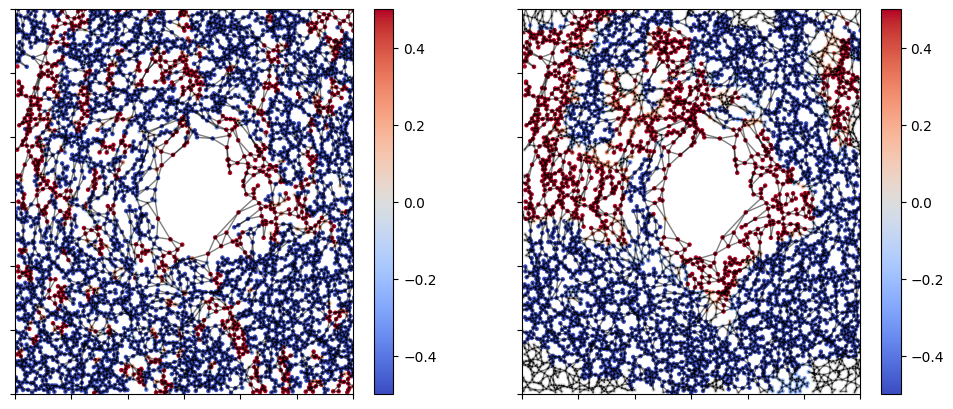

10317


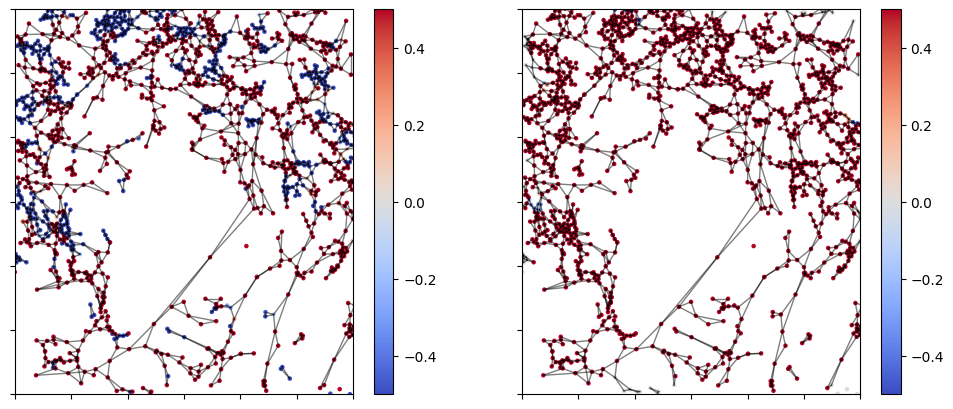

10318


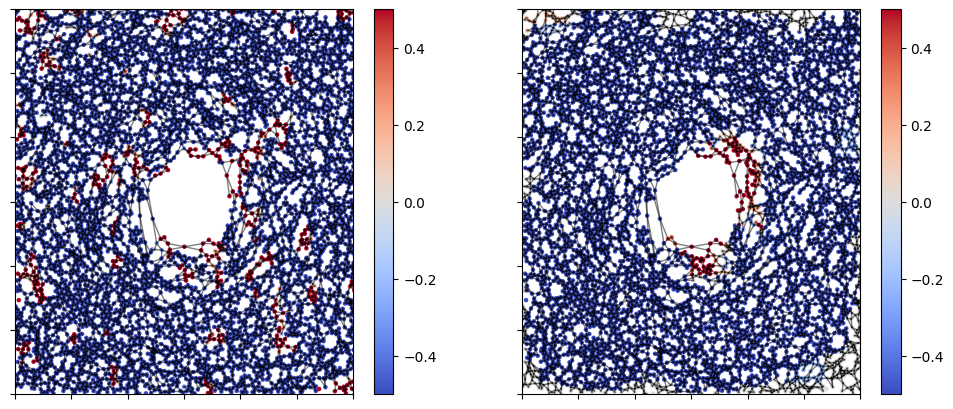

10319


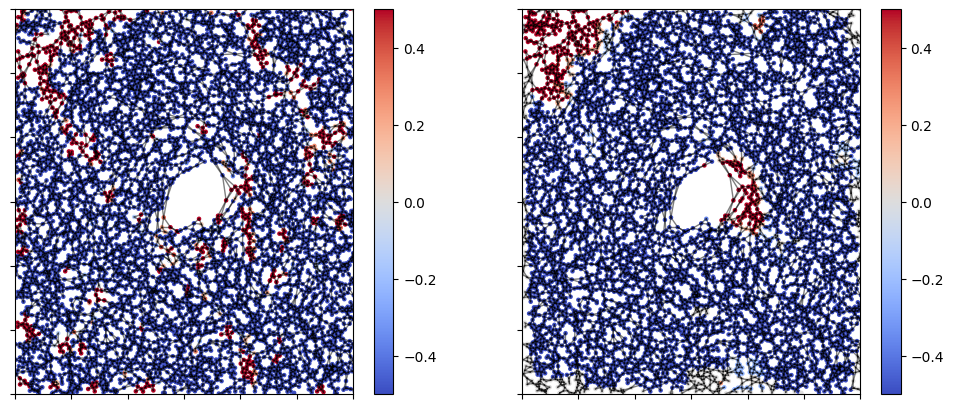

10320


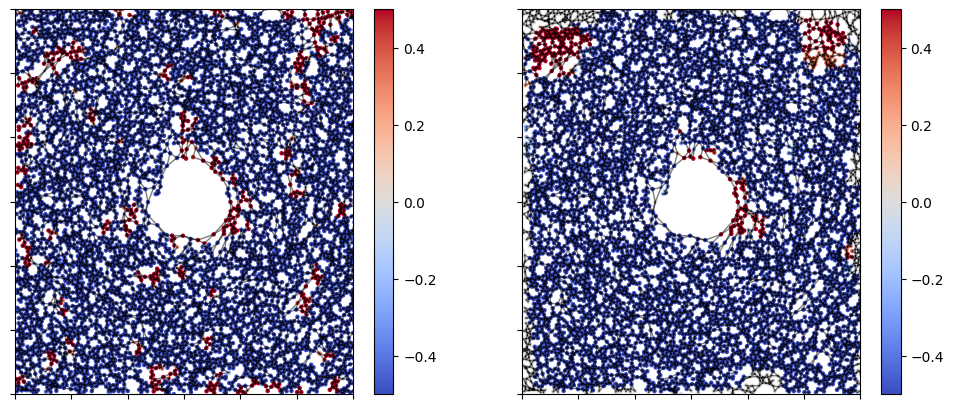

10321


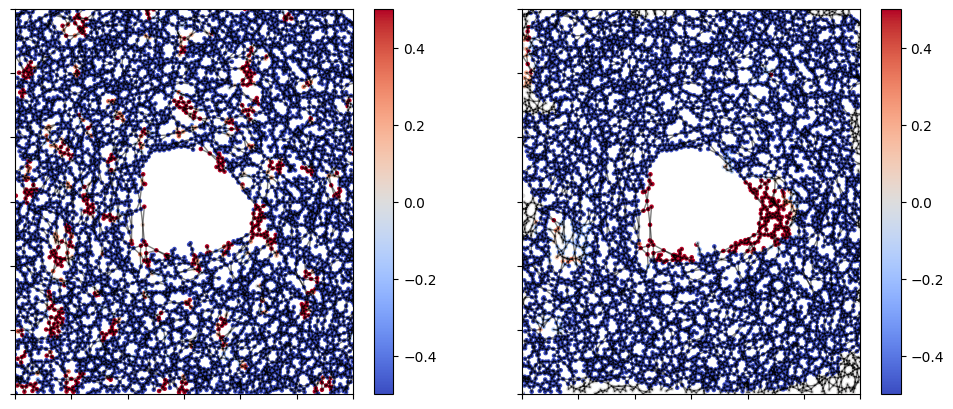

In [21]:

ct = 0
train_loader = DataLoader(train_list_bin, batch_size = 1, shuffle=False)
for data in train_loader:
    ct+=1
    print(data.graph_id[0].item())
    fig, ax = plt.subplots(1,2, figsize=(12,5))

    out = classifier.model.vals_without_aggregation(data.x, data.edge_index, data.batch)
    mean_vals = out[:,1] - out[:,0]
    graph_2D.GraphPlotter2D(octa500_loader_2_cls.line_data[data.graph_id[0].item()], line_G = True, pred_vals=mean_vals.cpu().detach().numpy()).plot_graph_2D(ax[0])#.plot_graph_2D()
    mean_vals = patch_evaluation.nodewise_mean_val(octa500_loader_2_cls, data.graph_id[0].item(), last_id_list, last_region_list, outList)
    graph_2D.GraphPlotter2D(octa500_loader_2_cls.line_data[data.graph_id[0].item()], line_G = True, pred_vals=mean_vals).plot_graph_2D(ax[1])

    plt.show()

    if ct == 20:
        break

In [ ]:

#for n_id_idx in np.arange(160):#diseased_idx:#np.arange(29,50,1):
#    n_id = ids[n_id_idx]
#    print(n_id_idx)
#    print(n_id)
#    mean_vals = nodewise_mean_val(octa500_loader_2_cls, n_id, last_id_list, last_region_list, outlist_conv)
#    graph_2D.GraphPlotter2D(octa500_loader_2_cls.line_data[n_id], line_G = True, pred_vals=mean_vals).plot_graph_2D()#.plot_graph_2D()
    #print(mean_vals)


    #break

In [ ]:


for n_id_idx in np.arange(160):#diseased_idx:#np.arange(29,50,1):
    n_id = ids[n_id_idx]
    print(n_id_idx)
    print(n_id)
    graph_2D.GraphPlotter2D(octa500_loader_2_cls.full_data[n_id]).plot_graph_2D()#.plot_graph_2D()
    break